# My Session 3

# Alternate

In [3]:
import os

import numpy as np
import matplotlib.pyplot as plt

from skimage.transform import resize
from skimage import data

from scipy.misc import imresize
import IPython.display as ipyd

import tensorflow as tf

from libs import utils, gif, datasets, dataset_utils, vae, dft

%matplotlib inline
plt.style.use('ggplot')

ImportError: cannot import name 'imresize' from 'scipy.misc' (/Users/akira/opt/anaconda3/envs/ds-env/lib/python3.9/site-packages/scipy/misc/__init__.py)

## Load

In [10]:
data_directory = './data/pokemon/jpeg/'
output_directory = './output'
experiment_title = 'random-4'

In [11]:
filenames = [os.path.join(data_directory, file_i)
              for file_i in os.listdir(data_directory)
              if '.jpg' in file_i]

In [12]:
filenames = filenames
# np.random.shuffle(filenames)

nb_clip = 100
filenames = filenames[:nb_clip]
imgs = [plt.imread(f) for f in filenames]

Xs = np.array(imgs)

print(Xs.shape)

(100, 64, 64, 3)


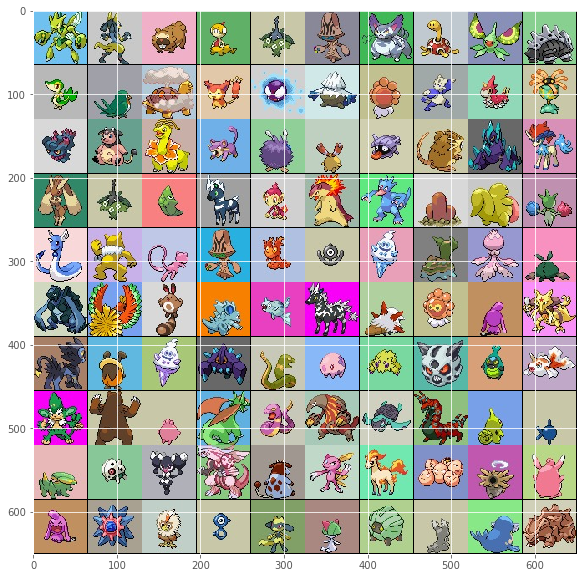

In [13]:
plt.figure(figsize=(10, 10))
plt.imshow(utils.montage(imgs).astype(np.uint8))

In [14]:
?datasets.Dataset

In [15]:
ds = datasets.Dataset(Xs)

(64, 64, 3)


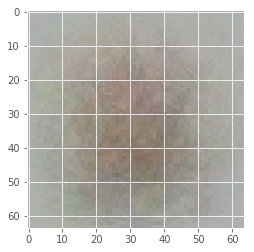

In [16]:
mean_img = ds.mean().astype(np.uint8)
plt.imshow(mean_img)
print(ds.mean().shape)

(64, 64, 3)


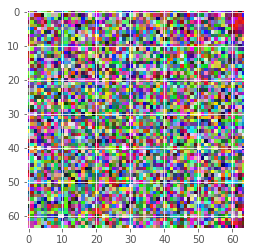

In [17]:
std_img = ds.std() #.astype(np.uint8)
plt.imshow(std_img)
print(std_img.shape)

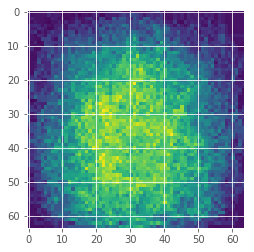

In [18]:
std_img = np.mean(std_img, axis=2)
plt.imshow(std_img)

(64, 64, 3)
(100, 64, 64, 3)


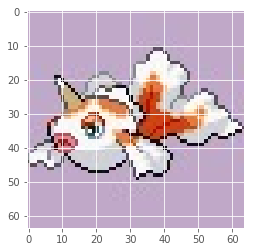

In [19]:
plt.imshow(ds.X[0])
print(ds.X[0].shape)
print(ds.X.shape)

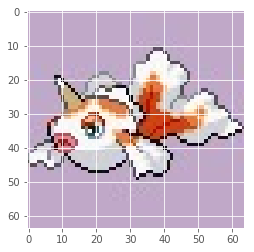

In [20]:
# Write a function to preprocess/normalize an image, given its dataset object
# (which stores the mean and standard deviation!)
def preprocess(img, ds):
    norm_img = (img - ds.mean()) / ds.std()
    return norm_img

# Write a function to undo the normalization of an image, given its dataset object
# (which stores the mean and standard deviation!)
def deprocess(norm_img, ds):
    img = norm_img * ds.std() + ds.mean()
    return img

# Just to make sure that you've coded the previous two functions correctly:
assert(np.allclose(deprocess(preprocess(ds.X[0], ds), ds), ds.X[0]))
plt.imshow(deprocess(preprocess(ds.X[0], ds), ds).astype(np.uint8))

In [21]:
# Calculate the number of features in your image.
# This is the total number of pixels, or (height x width x channels).
height = ds.X[0].shape[0]
width = ds.X[0].shape[1]
channels = ds.X[0].shape[2]

n_features = height * width * channels
print(n_features)

12288


In [22]:
print(64*64*3)

12288


In [23]:
# encoder_dimensions = [1024, 256, 64, 2]

# encoder_dimensions = [1024, 64, 16, 2]
encoder_dimensions = [1024, 64, 4]
# encoder_dimensions = [1024, 512, 256, 128, 64, 32, 16, 8]

In [24]:
tf.reset_default_graph()

In [25]:
X = tf.placeholder(tf.float32, shape = (None, n_features), name = "X")
                   
assert(X.get_shape().as_list() == [None, n_features])

In [26]:
def encode(X, dimensions, activation=tf.nn.tanh):
    # We're going to keep every matrix we create so let's create a list to hold them all
    Ws = []

    # We'll create a for loop to create each layer:
    for layer_i, n_output in enumerate(dimensions):

        # This will simply prefix all the variables made in this scope
        # with the name we give it.  Make sure it is a unique name
        # for each layer, e.g., 'encoder/layer1', 'encoder/layer2', or
        # 'encoder/1', 'encoder/2',... 
        with tf.variable_scope("encode/layer" + str(layer_i + 1)):

            # Create a weight matrix which will increasingly reduce
            # down the amount of information in the input by performing
            # a matrix multiplication.  You can use the utils.linear function.
            h, W = utils.linear(X, dimensions[layer_i])

            # Finally we'll store the weight matrix.
            # We need to keep track of all
            # the weight matrices we've used in our encoder
            # so that we can build the decoder using the
            # same weight matrices.
            Ws.append(W)
            
            # Replace X with the current layer's output, so we can
            # use it in the next layer.
            X = h
    
    z = X
    return Ws, z

In [27]:
# Then call the function
Ws, z = encode(X, encoder_dimensions)

# And just some checks to make sure you've done it right.
# assert(z.get_shape().as_list() == [None, 2])
# assert(len(Ws) == len(encoder_dimensions))

In [28]:
# We'll first reverse the order of our weight matrices
decoder_Ws = Ws[::-1]

# then reverse the order of our dimensions
# appending the last layers number of inputs.
decoder_dimensions = encoder_dimensions[::-1][1:] + [n_features]
print(decoder_dimensions)

assert(decoder_dimensions[-1] == n_features)

[64, 1024, 12288]


In [29]:
def decode(z, dimensions, Ws, activation=tf.nn.tanh):
    current_input = z
    for layer_i, n_output in enumerate(dimensions):
        # we'll use a variable scope again to help encapsulate our variables
        # This will simply prefix all the variables made in this scope
        # with the name we give it.
        with tf.variable_scope("decoder/layer/{}".format(layer_i)):

            # Now we'll grab the weight matrix we created before and transpose it
            # So a 3072 x 784 matrix would become 784 x 3072
            # or a 256 x 64 matrix, would become 64 x 256
            W = tf.transpose(Ws[layer_i])

            # Now we'll multiply our input by our transposed W matrix
            h = tf.matmul(current_input, W)

            # And then use a relu activation function on its output
            current_input = activation(h)

            # We'll also replace n_input with the current n_output, so that on the
            # next iteration, our new number inputs will be correct.
            n_input = n_output
    Y = current_input
    return Y

In [30]:
Y = decode(z, decoder_dimensions, decoder_Ws)

In [31]:
Y.get_shape().as_list()

[None, 12288]

In [32]:
# Calculate some measure of loss, e.g. the pixel to pixel absolute difference or squared difference
loss = tf.squared_difference(X, Y)

# Now sum over every pixel and then calculate the mean over the batch dimension (just like session 2!)
# hint, use tf.reduce_mean and tf.reduce_sum
cost = tf.reduce_sum(loss)

In [33]:
learning_rate = 0.001
optimizer = tf.train.AdamOptimizer(learning_rate).minimize(cost)

In [34]:
from libs import tboard
tboard.show_graph(tf.get_default_graph().as_graph_def())

Instructions for updating:
Use `tf.global_variables_initializer` instead.
0 123.21635


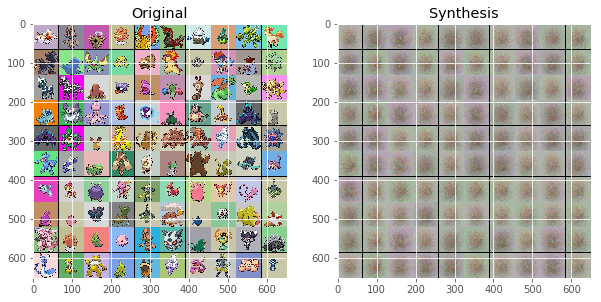

1 113.2742
2 101.8404375
3 94.4370875
4 90.854175
5 88.179125
6 85.7786
7 83.1738
8 81.27718125
9 80.13569375
10 79.98766875


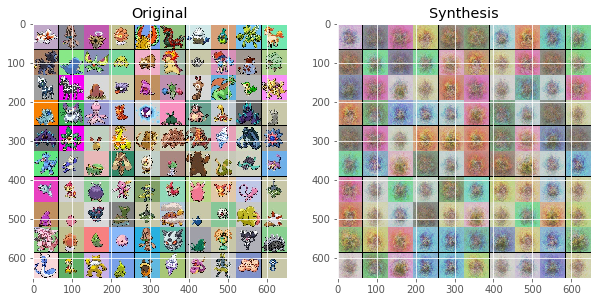

11 80.029275
12 79.77063125
13 78.96675625
14 78.2690125
15 77.98735
16 77.66414375
17 77.1556375
18 76.695725
19 76.3133125
20 76.28095


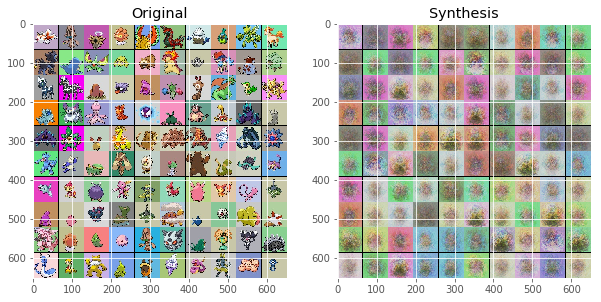

21 75.97176875
22 75.57725
23 74.9729125
24 74.214475
25 73.51455
26 73.1669875
27 72.813525
28 72.41633125
29 71.9850875
30 71.55255


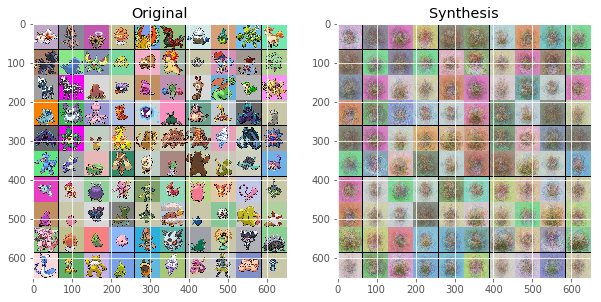

31 71.1037
32 70.8200875
33 70.66265625
34 70.45620625
35 70.3248625
36 69.9767375
37 69.6727375
38 69.12755625
39 68.83419375
40 68.3951


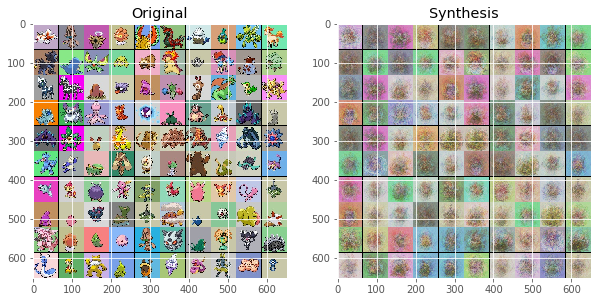

41 68.02719375
42 67.6522125
43 67.50526875
44 67.4181875
45 66.9822125
46 66.90885
47 66.74294375
48 66.8466875
49 66.52648125
50 66.0657375


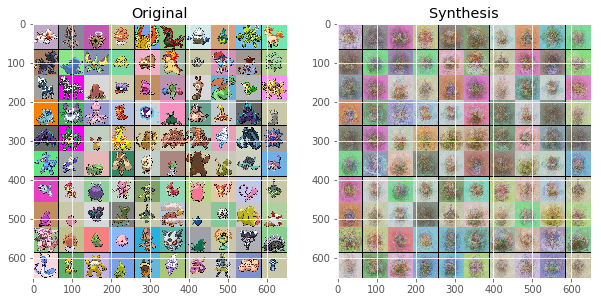

51 66.02215625
52 65.845925
53 65.34749375
54 65.8528875
55 65.51093125
56 65.158875
57 65.36925
58 64.773425
59 66.3899375
60 66.393875


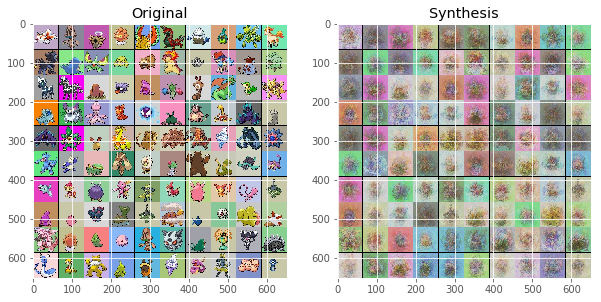

61 65.2184
62 65.7711
63 64.9332875
64 65.3511
65 66.521525
66 66.6153375
67 64.99490625
68 64.59925
69 67.2674875
70 66.7476375


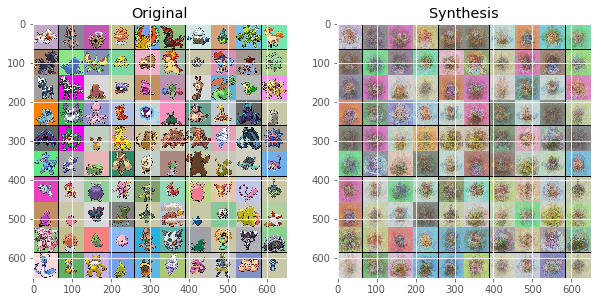

71 65.3975125
72 64.88221875
73 65.24115
74 65.6080625
75 65.215625
76 64.52983125
77 63.85133125
78 64.66671875
79 65.03999375
80 64.67193125


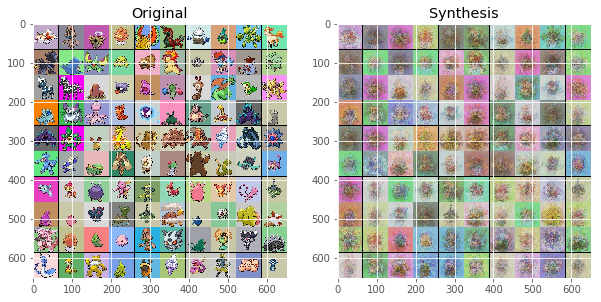

81 64.5179375
82 64.7353875
83 63.8384625
84 64.192275
85 64.3553875
86 63.52405
87 63.1542875
88 63.68975625
89 63.75436875
90 62.895675


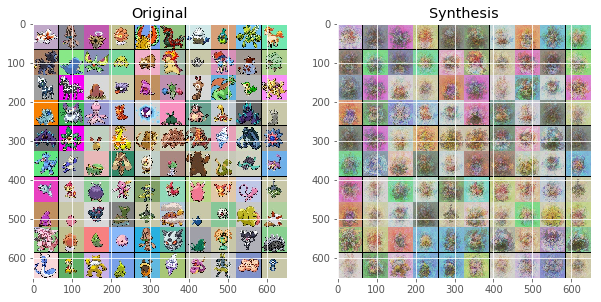

91 62.982675
92 63.98775
93 65.00208125
94 64.1266
95 63.0862375
96 62.5411375
97 62.0137125
98 62.2748875
99 62.704575
100 62.7689875


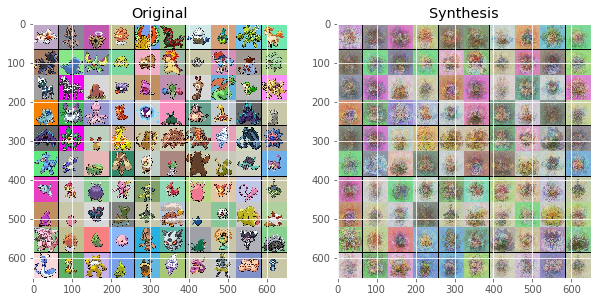

101 62.292975
102 62.0233875
103 62.037025
104 62.428675
105 61.7135375
106 61.4028625
107 61.567525
108 61.38235
109 61.5276
110 61.7434625


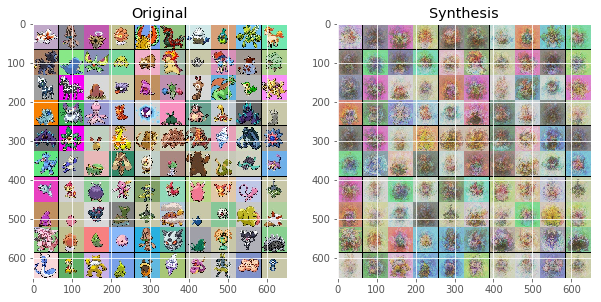

111 61.39198125
112 61.34133125
113 61.3429875
114 60.644025
115 59.99379375
116 59.84631875
117 60.46834375
118 60.2121125
119 59.91035625
120 59.3663625


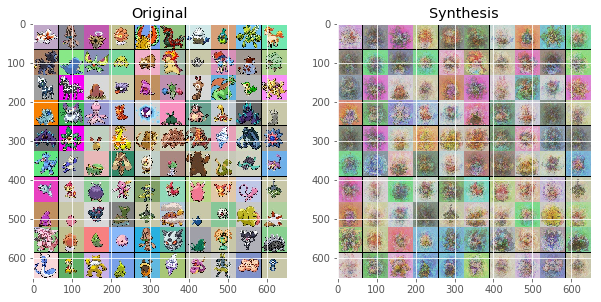

121 59.5726375
122 59.362825
123 59.57505
124 59.06414375
125 59.1353625
126 59.337
127 59.03251875
128 58.6334875
129 58.28113125
130 58.38839375


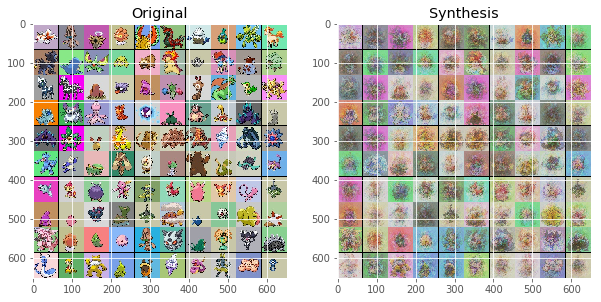

131 58.9619
132 58.45180625
133 58.0769625
134 58.21931875
135 58.41155625
136 57.86845625
137 57.57224375
138 57.416725
139 57.5858625
140 57.57096875


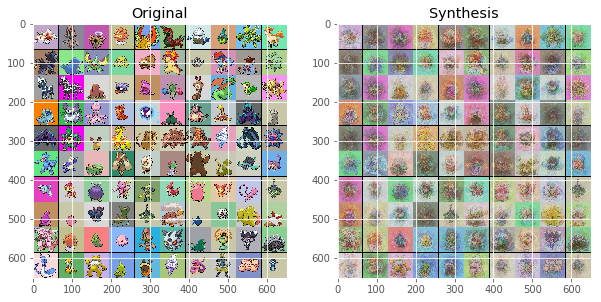

141 57.6077125
142 57.53389375
143 57.8214625
144 57.8162625
145 57.2483875
146 57.26305
147 56.81254375
148 57.6083125
149 57.75873125
150 56.7131625


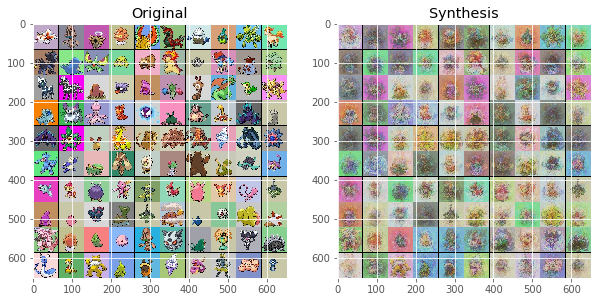

151 58.13903125
152 56.95241875
153 57.0998625
154 57.167525
155 56.32341875
156 57.0148625
157 57.91704375
158 57.7557125
159 57.20668125
160 56.39786875


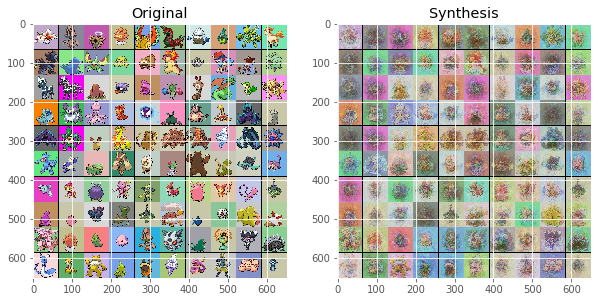

161 56.33410625
162 56.92386875
163 57.272275
164 56.87476875
165 55.9946
166 56.2408875
167 56.0862625
168 56.6154375
169 56.306875
170 56.743475


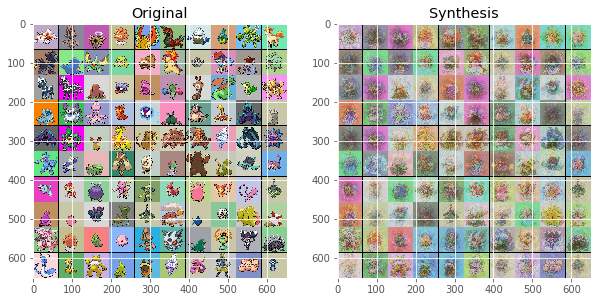

171 57.07235
172 56.83828125
173 55.773325
174 55.9937375
175 55.7187
176 55.44325
177 55.87620625
178 57.1850375
179 55.9863
180 55.06365


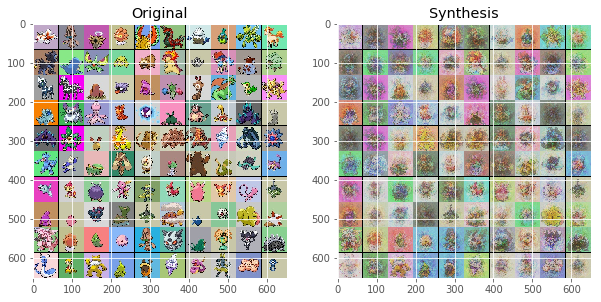

181 55.079125
182 55.549175
183 56.297175
184 56.30575
185 55.6537125
186 55.16384375
187 55.07730625
188 55.989125
189 55.3216625
190 55.33175


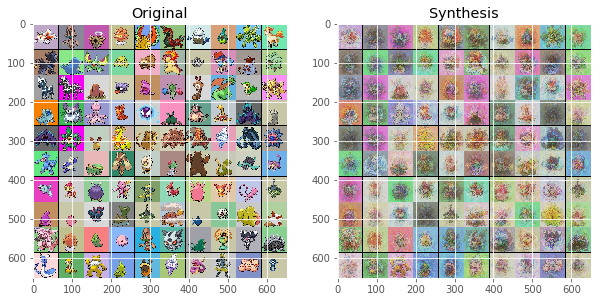

191 55.29106875
192 55.7286375
193 55.623975
194 55.8836875
195 55.39408125
196 55.3407125
197 55.39254375
198 54.8712125
199 54.270275
200 54.42975


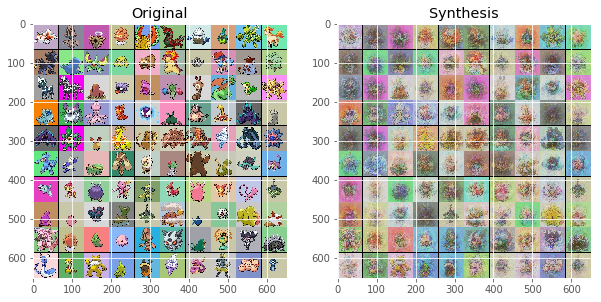

201 53.93985625
202 53.76455
203 54.46884375
204 54.4683625
205 54.498075
206 53.2026875
207 55.08424375
208 58.1455625
209 59.289075
210 58.28615625


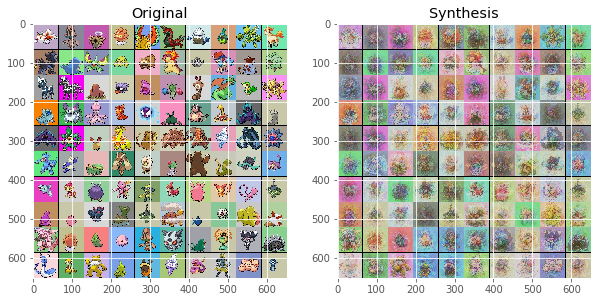

211 57.700125
212 60.57251875
213 63.6774875
214 65.74966875
215 66.67214375
216 67.10004375
217 68.3082875
218 67.16083125
219 67.34293125
220 67.8348125


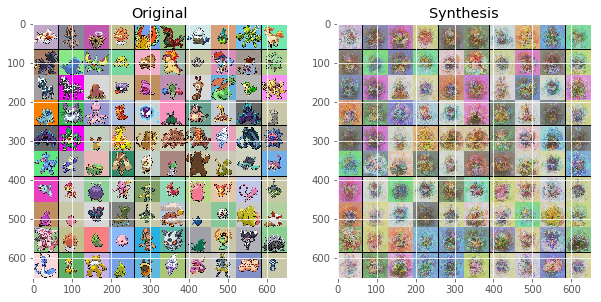

221 67.2536625
222 66.53944375
223 66.879
224 64.8496
225 63.185325
226 62.5561625
227 60.9960875
228 60.16703125
229 61.00978125
230 62.5815


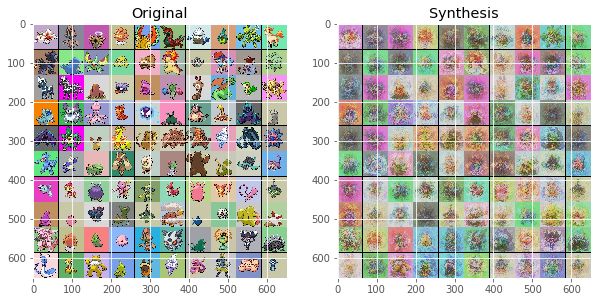

231 63.323025
232 62.7019375
233 61.5980625
234 62.42059375
235 63.087725
236 61.7555625
237 59.605925
238 60.0784625
239 61.72929375
240 62.01568125


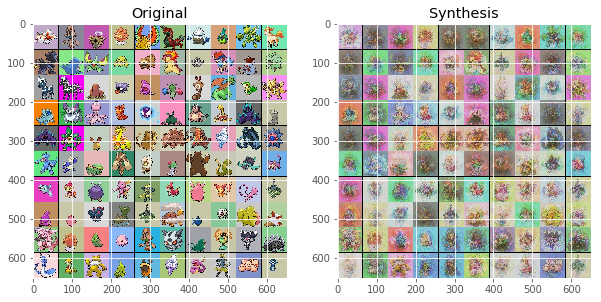

241 61.45005
242 62.29755
243 61.83338125
244 61.80169375
245 61.52595
246 60.46836875
247 59.211925
248 58.3576625
249 57.36871875
250 57.2173625


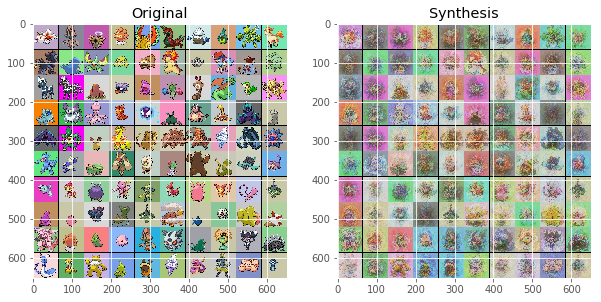

In [36]:
# Create a tensorflow session and initialize all of our weights:
sess = tf.Session()
sess.run(tf.initialize_all_variables())

# Some parameters for training
batch_size = 100
n_epochs = 251
step = 10

# We'll try to reconstruct the same first 100 images and show how
# The network does over the course of training.
examples = ds.X[:100]

# We have to preprocess the images before feeding them to the network.
# I'll do this once here, so we don't have to do it every iteration.
test_examples = preprocess(examples, ds).reshape(-1, n_features)

# If we want to just visualize them, we can create a montage.
test_images = utils.montage(examples).astype(np.uint8)

# Store images so we can make a gif
gifs = []

# Now for our training:
for epoch_i in range(n_epochs):
    
    # Keep track of the cost
    this_cost = 0
    
    # Iterate over the entire dataset in batches
    for batch_X, _ in ds.train.next_batch(batch_size = batch_size):
        
        # Preprocess and reshape our current batch, batch_X:
        this_batch = preprocess(batch_X, ds).reshape(-1, n_features)
        
        # Compute the cost, and run the optimizer.
        this_cost += sess.run([cost, optimizer], feed_dict = {X: this_batch})[0]
    
    # Average cost of this epoch
    avg_cost = this_cost / ds.X.shape[0] / batch_size
    print(epoch_i, avg_cost)
    
    # Let's also try to see how the network currently reconstructs the input.
    # We'll draw the reconstruction every `step` iterations.
    if epoch_i % step == 0:
        
        # Ask for the output of the network, Y, and give it our test examples
        recon = sess.run(Y, feed_dict = {X: test_examples})
                         
        # Resize the 2d to the 4d representation:
        rsz = recon.reshape(examples.shape)

        # We have to unprocess the image now, removing the normalization
        unnorm_img = deprocess(rsz, ds)
                         
        # Clip to avoid saturation
        clipped = np.clip(unnorm_img, 0, 255)

        # And we can create a montage of the reconstruction
        recon = utils.montage(clipped).astype(np.uint8)
        
        # Store for gif
        gifs.append(recon)

        fig, axs = plt.subplots(1, 2, figsize=(10, 10))
        axs[0].imshow(test_images)
        axs[0].set_title('Original')
        axs[1].imshow(recon)
        axs[1].set_title('Synthesis')
        fig.canvas.draw()
        plt.show()

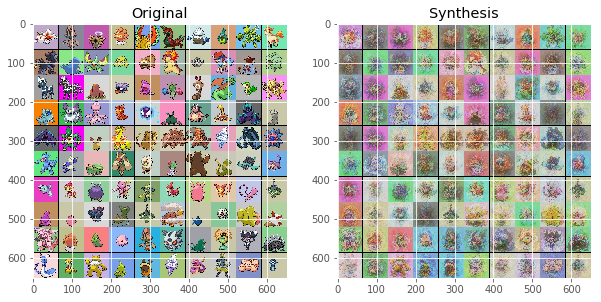

In [37]:
fig, axs = plt.subplots(1, 2, figsize=(10, 10))
axs[0].imshow(test_images)
axs[0].set_title('Original')
axs[1].imshow(recon)
axs[1].set_title('Synthesis')
fig.canvas.draw()
plt.show()
plt.imsave(arr=test_images, fname=os.path.join(output_directory, experiment_title + '-pokemon-test-4.png'))
plt.imsave(arr=recon, fname=os.path.join(output_directory, experiment_title +'-pokemon-recon-4.png'))

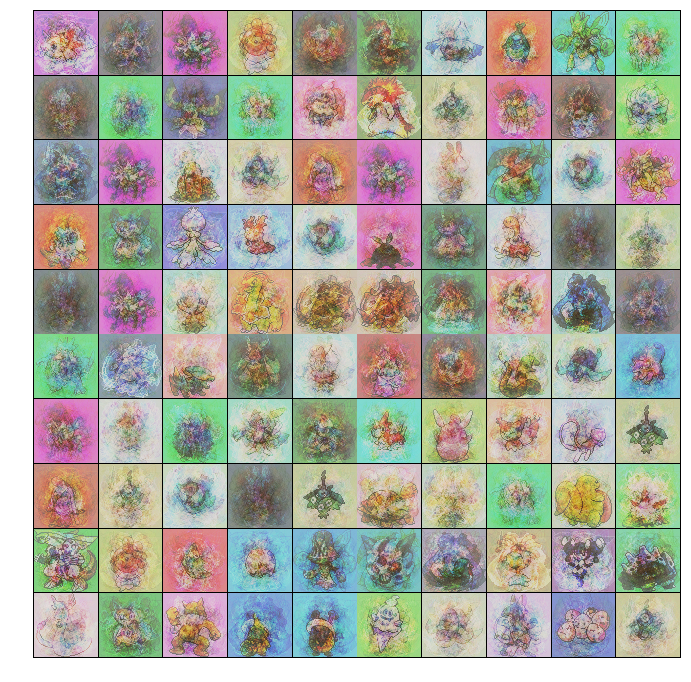

In [38]:
gif.build_gif(gifs, interval=0.2, saveto=os.path.join(output_directory, experiment_title +'-reconstruction.gif'))
ipyd.Image(url=os.path.join(output_directory, experiment_title +'-reconstruction.gif?{}').format(np.random.rand()),
           height=500, width=500)